In [1]:
import numpy as np
import pandas as pd
import os
import pdb
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

np.random.seed(97)

In [2]:
sequence_analysis_dir = "/global/scratch/users/aniketh/promoter_modelling/jax_data/sequence_analysis_v8_TITAN/"
coms_sequences = pickle.load(open(os.path.join(sequence_analysis_dir, "coms_seqs_eval.pkl"), "rb"))
dens_sequences = pickle.load(open(os.path.join(sequence_analysis_dir, "den_seqs_eval.pkl"), "rb"))
dataset_sequences = pickle.load(open(os.path.join(sequence_analysis_dir, "dataset_seqs_eval.pkl"), "rb"))

In [3]:
print("coms_sequences", coms_sequences.keys())
print()
print("dens_sequences", dens_sequences.keys())
print()
print("dataset_sequences", dataset_sequences.keys())

coms_sequences dict_keys(['ds_jurkat_diff', 'ds_jurkat_pred', 'ds_k562_diff', 'ds_k562_pred', 'ds_thp1_diff', 'ds_thp1_pred', 'jurkat_gap', 'jurkat_n_mutations', 'jurkat_opt_seq_jurkat_diff', 'jurkat_opt_seq_jurkat_pred', 'jurkat_opt_seq_k562_diff', 'jurkat_opt_seq_k562_pred', 'jurkat_opt_seq_thp1_diff', 'jurkat_opt_seq_thp1_pred', 'jurkat_optimized_seq', 'jurkat_output', 'k562_gap', 'k562_opt_seq_jurkat_diff', 'k562_opt_seq_jurkat_pred', 'k562_opt_seq_k562_diff', 'k562_opt_seq_k562_pred', 'k562_opt_seq_thp1_diff', 'k562_opt_seq_thp1_pred', 'k562_optimized_seq', 'k562_output', 'opt_jurkat_diff', 'opt_jurkat_pred', 'opt_k562_diff', 'opt_k562_pred', 'opt_thp1_diff', 'opt_thp1_pred', 'original_seq', 'thp1_gap', 'thp1_opt_seq_jurkat_diff', 'thp1_opt_seq_jurkat_pred', 'thp1_opt_seq_k562_diff', 'thp1_opt_seq_k562_pred', 'thp1_opt_seq_thp1_diff', 'thp1_opt_seq_thp1_pred', 'thp1_optimized_seq', 'thp1_output', 'coms_loss_weight', 'ensemble_jurkat_optimized_seq_thp1_pred', 'ensemble_jurkat_optim

In [4]:
final_sequences = {}
final_sequences["design_method"] = []
final_sequences["designed_for"] = []
final_sequences["original_sequence"] = []
final_sequences["sequence"] = []
final_sequences["coms_alpha"] = []
final_sequences["diversity_loss_coef"] = []
final_sequences["entropy_loss_coef"] = []
# final_sequences["n_mutations"] = []
for cell in ["Jurkat", "K562", "THP1"]:
    final_sequences[cell] = []
    final_sequences[cell + "_measured"] = []
    final_sequences[cell + "_std"] = []
    final_sequences[cell + "_design_model"] = []

# process COMs sequences
ori_sequences = coms_sequences["original_seq"].astype(str)
ori_sequences[ori_sequences == "0"] = "A"
ori_sequences[ori_sequences == "1"] = "C"
ori_sequences[ori_sequences == "2"] = "G"
ori_sequences[ori_sequences == "3"] = "T"
ori_sequences = ["".join(i) for i in ori_sequences]

for cell in ["jurkat", "k562", "thp1"]:
    print(cell)
    sequences = coms_sequences[f"{cell}_optimized_seq"].astype(str)
    sequences[sequences == "0"] = "A"
    sequences[sequences == "1"] = "C"
    sequences[sequences == "2"] = "G"
    sequences[sequences == "3"] = "T"
    
    corrected_cell_name = cell.upper()
    if cell == "jurkat":
        corrected_cell_name = "Jurkat"
    
    final_sequences["designed_for"] = final_sequences["designed_for"] + [corrected_cell_name for i in range(sequences.shape[0])]
    final_sequences["original_sequence"] = final_sequences["original_sequence"] + ori_sequences.copy()
    final_sequences["sequence"] = final_sequences["sequence"] + ["".join(i) for i in sequences]
    final_sequences["coms_alpha"] = final_sequences["coms_alpha"] + list(coms_sequences["coms_loss_weight"])
    final_sequences["diversity_loss_coef"] = final_sequences["diversity_loss_coef"] + [None for i in sequences]
    final_sequences["entropy_loss_coef"] = final_sequences["entropy_loss_coef"] + [None for i in sequences]
    final_sequences["design_method"] = final_sequences["design_method"] + ["COMs" for i in sequences]
#     final_sequences["n_mutations"] = final_sequences["n_mutations"] + list(coms_sequences[f"{cell}_n_mutations"])
    
    for cell2 in ["Jurkat", "K562", "THP1"]:
        final_sequences[cell2] = final_sequences[cell2] + list(coms_sequences[f"ensemble_{cell}_optimized_seq_{cell2.lower()}_pred"].mean(axis=0))
        final_sequences[cell2 + "_measured"] = final_sequences[cell2 + "_measured"] + [None for i in sequences]
        final_sequences[cell2 + "_std"] = final_sequences[cell2 + "_std"] + list(coms_sequences[f"ensemble_{cell}_optimized_seq_{cell2.lower()}_pred"].std(axis=0))
        final_sequences[cell2 + "_design_model"] = final_sequences[cell2 + "_design_model"] + list(coms_sequences[f"{cell}_opt_seq_{cell2.lower()}_pred"])

jurkat
k562
thp1


In [5]:
# process DENs sequences
final_sequences["designed_for"] = final_sequences["designed_for"] + list(dens_sequences["designed_for"])
final_sequences["design_method"] = final_sequences["design_method"] + ["DENs" for i in dens_sequences["sequence"]]
final_sequences["original_sequence"] = final_sequences["original_sequence"] + [None for i in dens_sequences["sequence"]]

dens_seqs = dens_sequences["sequence"].astype(str)
dens_seqs[dens_seqs == "0"] = "A"
dens_seqs[dens_seqs == "1"] = "C"
dens_seqs[dens_seqs == "2"] = "G"
dens_seqs[dens_seqs == "3"] = "T"
dens_seqs = ["".join(i) for i in dens_seqs]
final_sequences["sequence"] = final_sequences["sequence"] + dens_seqs

final_sequences["coms_alpha"] = final_sequences["coms_alpha"] + [float(i.split("_")[1]) for i in dens_sequences["design_model"]]
final_sequences["diversity_loss_coef"] = final_sequences["diversity_loss_coef"] + list(dens_sequences["diversity_loss_coef"])
final_sequences["entropy_loss_coef"] = final_sequences["entropy_loss_coef"] + list(dens_sequences["entropy_loss_coef"])

for cell2 in ["Jurkat", "K562", "THP1"]:
    final_sequences[cell2] = final_sequences[cell2] + list(dens_sequences[f"ensemble_sequence_{cell2.lower()}_pred"].mean(axis=0))
    final_sequences[cell2 + "_measured"] = final_sequences[cell2 + "_measured"] + [None for i in dens_sequences["designed_for"]]
    final_sequences[cell2 + "_std"] = final_sequences[cell2 + "_std"] + list(dens_sequences[f"ensemble_sequence_{cell2.lower()}_pred"].std(axis=0))
    final_sequences[cell2 + "_design_model"] = final_sequences[cell2 + "_design_model"] + list(dens_sequences[f"{cell2}"])

In [6]:
# process original dataset sequences
final_sequences["designed_for"] = final_sequences["designed_for"] + [None for i in dataset_sequences["sequences"]]
final_sequences["design_method"] = final_sequences["design_method"] + ["Dataset" for i in dataset_sequences["sequences"]]
final_sequences["original_sequence"] = final_sequences["original_sequence"] + [None for i in dataset_sequences["sequences"]]

dataset_seqs = dataset_sequences["sequences"].astype(str)
dataset_seqs[dataset_seqs == "0"] = "A"
dataset_seqs[dataset_seqs == "1"] = "C"
dataset_seqs[dataset_seqs == "2"] = "G"
dataset_seqs[dataset_seqs == "3"] = "T"
dataset_seqs = ["".join(i) for i in dataset_seqs]
final_sequences["sequence"] = final_sequences["sequence"] + dataset_seqs

final_sequences["coms_alpha"] = final_sequences["coms_alpha"] + [None for i in dataset_sequences["sequences"]]
final_sequences["diversity_loss_coef"] = final_sequences["diversity_loss_coef"] + [None for i in dataset_sequences["sequences"]]
final_sequences["entropy_loss_coef"] = final_sequences["entropy_loss_coef"] + [None for i in dataset_sequences["sequences"]]

for cell2 in ["Jurkat", "K562", "THP1"]:
    final_sequences[cell2] = final_sequences[cell2] + list(dataset_sequences[f"ensemble_sequences_{cell2.lower()}_pred"].mean(axis=0))
    final_sequences[cell2 + "_measured"] = final_sequences[cell2 + "_measured"] + list(dataset_sequences[f"{cell2.lower()}_output"])
    final_sequences[cell2 + "_std"] = final_sequences[cell2 + "_std"] + list(dataset_sequences[f"ensemble_sequences_{cell2.lower()}_pred"].std(axis=0))
    final_sequences[cell2 + "_design_model"] = final_sequences[cell2 + "_design_model"] + [None for i in dataset_sequences["sequences"]]

In [7]:
final_sequences = pd.DataFrame(final_sequences)

In [8]:
final_sequences

,design_method,designed_for,original_sequence,sequence,coms_alpha,diversity_loss_coef,entropy_loss_coef,Jurkat,Jurkat_measured,Jurkat_std,Jurkat_design_model,K562,K562_measured,K562_std,K562_design_model,THP1,THP1_measured,THP1_std,THP1_design_model
0,COMs,Jurkat,GTCTCTGGGCCGGAAGCCCCCTCTCCTCCCCCGCCGCAGCCCCCTC...,TCGAATAGTCCTATAAGCTCGTAAACTCCTACGCCACTATTCAGTA...,0.0,NaN,NaN,1.530639,NaN,0.430783,1.771498,1.144997,NaN,0.286043,0.804079,0.367058,NaN,0.230247,0.430588
1,COMs,Jurkat,ACCCGTGGGGAGGCGGTGAACTCCTCCGCAGGGGCCGATGCCCGGG...,TCAGGTGGGGGGGGGGCTTCGCGAGGCGCGCTGTCGTAAAATCGGC...,0.0,NaN,NaN,1.862692,NaN,0.363866,3.341140,1.564895,NaN,0.238900,1.947420,0.408570,NaN,0.222906,0.990403
2,COMs,Jurkat,CGCTACCTCACTCACGGGCGAGAACTAAGCACCTACTGTGGACCCG...,CGTGATGTCATTCCGTGGGGAATCATTATGTATCAATAGGTATGCC...,0.0,NaN,NaN,1.876609,NaN,0.448629,2.546996,1.344369,NaN,0.309212,1.120590,0.419875,NaN,0.375270,0.293634
3,COMs,Jurkat,AACCTGGGACAACAGCAAAAAAAAAAAAAAAAAAAAAAAGGCCCCA...,ATGGTGAGAATTCATTAGTTAGTAAATAATGAGGGCGGGGGCGTGA...,0.0,NaN,NaN,1.007456,NaN,0.250203,1.677430,0.760870,NaN,0.216337,0.617886,-0.029005,NaN,0.148915,0.014313
4,COMs,Jurkat,ACCCGGTGCCGGAGGCCGTGGGCGGCGACATGCAGCAGCTGAACCA...,AATGGCACGCGTAAACGGCATGTAAAGCCATAGAGCAGGTAAGGCG...,0.0,NaN,NaN,1.246738,NaN,0.442129,2.424667,0.939360,NaN,0.246521,1.290604,0.205520,NaN,0.147777,0.540153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1403531,Dataset,None,None,ATGTGGGCCATTTACTGTCACTCATCTGTTGGTCATTTTACTTCCT...,NaN,NaN,NaN,0.097397,-0.590653,0.101853,NaN,0.100894,-0.528565,0.075241,NaN,0.116326,-0.230199,0.070366,NaN
1403532,Dataset,None,None,GAATGTATGTACATTTGTTCCTGAGATACAGGTTGATGGACGGATG...,NaN,NaN,NaN,-0.564496,-0.659500,0.149145,NaN,-0.802575,-0.741503,0.172783,NaN,-0.229512,-0.150542,0.044503,NaN
1403533,Dataset,None,None,CTGGGGCTGGGCAGAGGGCAGGGAGGGGAAGGGTCCTGACCTCTGA...,NaN,NaN,NaN,-0.642783,-0.326443,0.120838,NaN,-0.646734,-0.534671,0.101290,NaN,-0.239866,-0.261736,0.053899,NaN
1403534,Dataset,None,None,CCTTCCAAATCCTCCTCCTAGAAGCCCTCCTTGGTTGGCCCTGCCT...,NaN,NaN,NaN,-0.343647,-0.498950,0.091712,NaN,-0.485435,-0.507953,0.081109,NaN,-0.171747,-0.207486,0.062765,NaN


In [9]:
final_sequences.to_parquet(os.path.join(sequence_analysis_dir, "final_sequences.parquet"))

In [4]:
final_sequences = pd.read_parquet(os.path.join(sequence_analysis_dir, "final_sequences.parquet"))

COMs


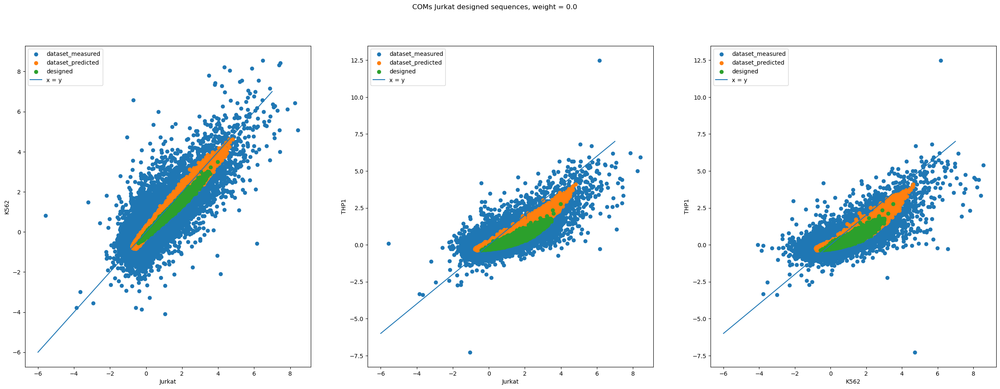

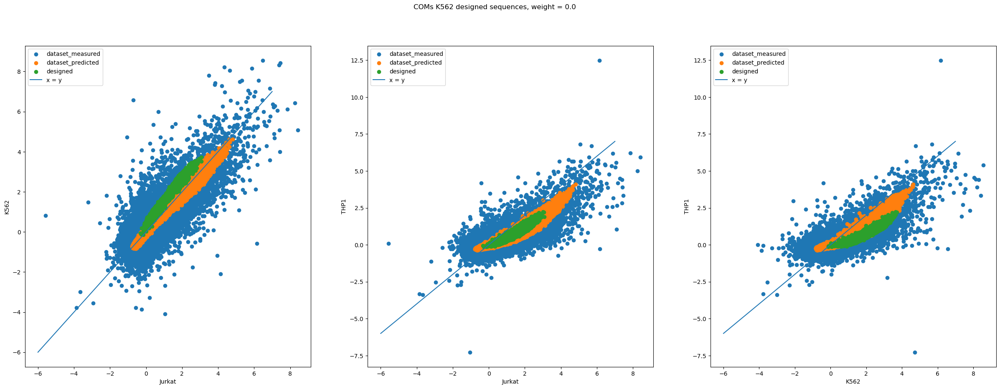

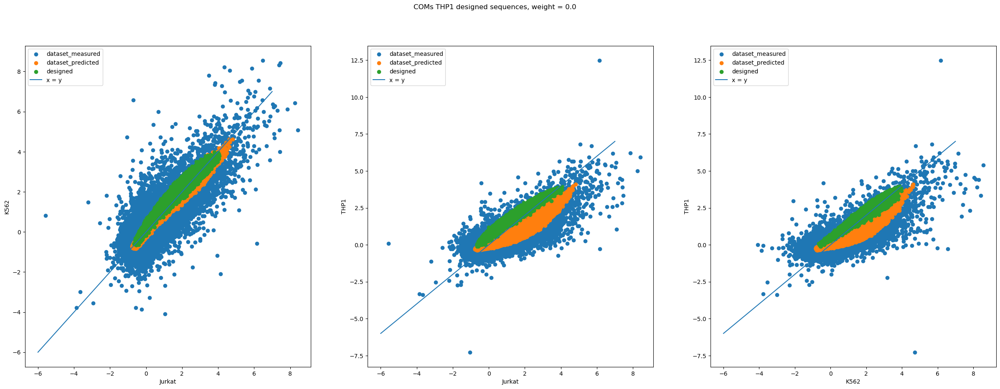

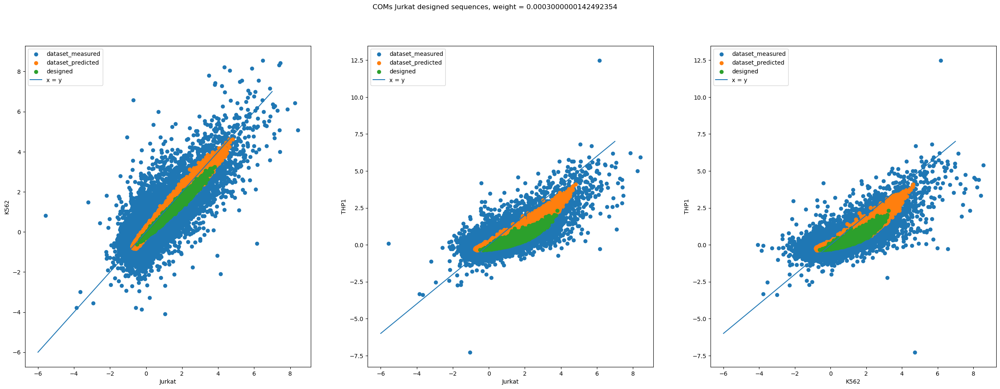

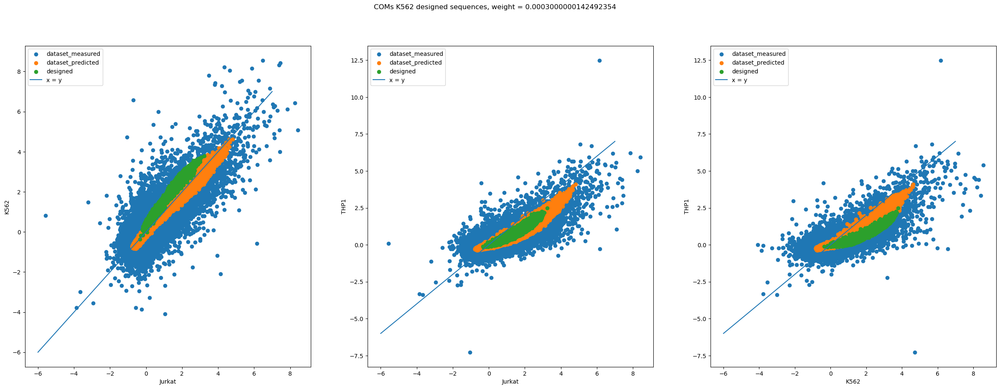

...

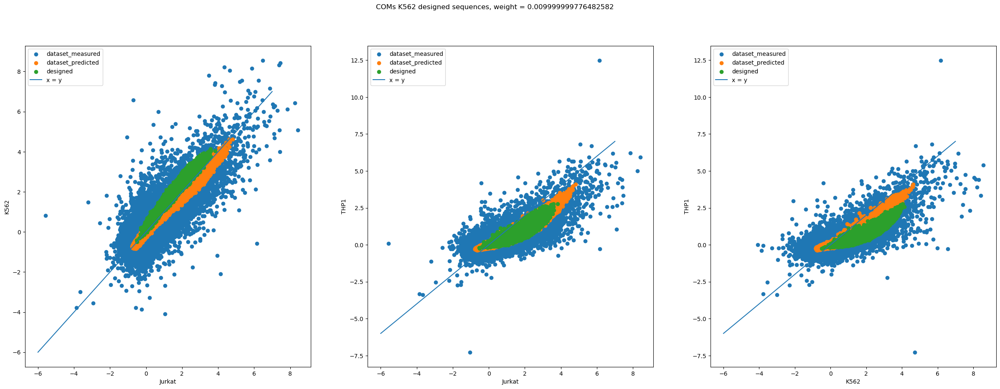

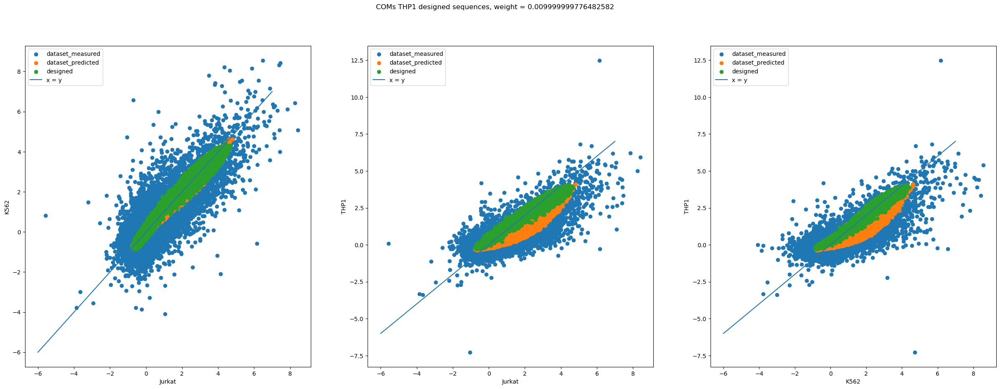

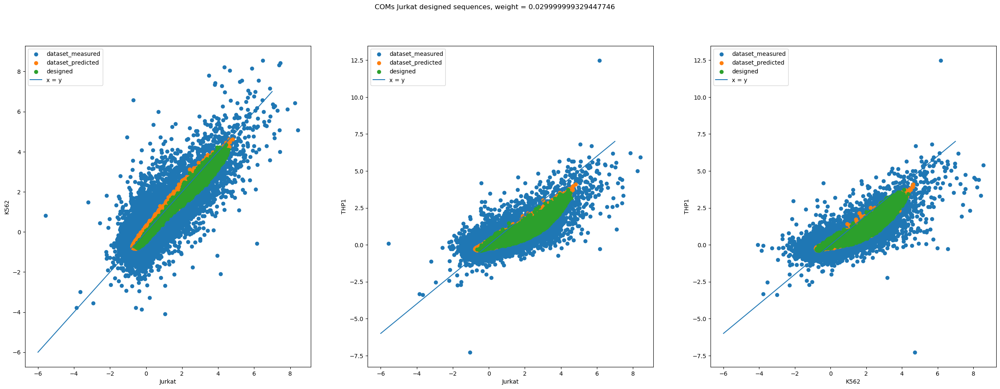

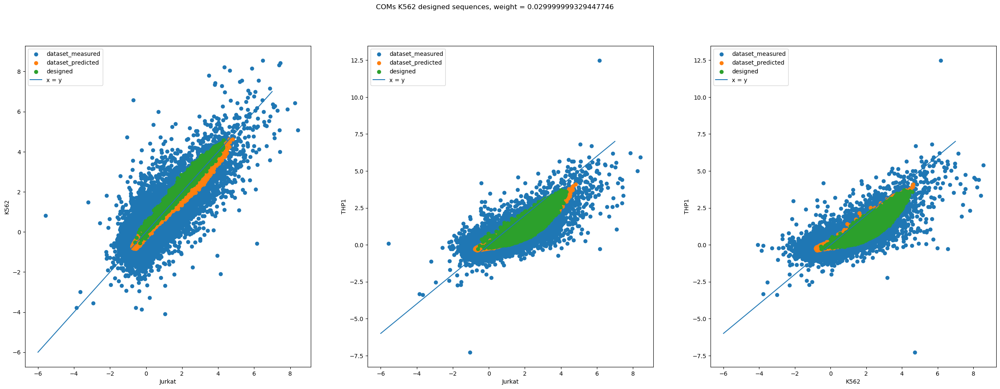

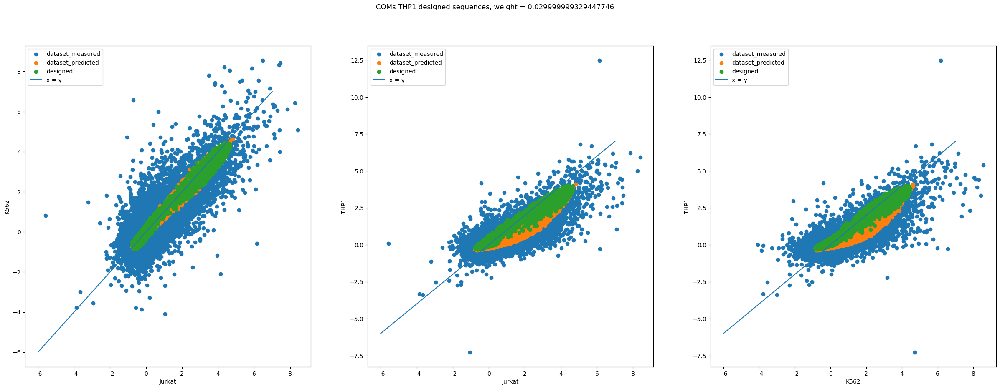

In [10]:
dataset_df = final_sequences[final_sequences["design_method"] == "Dataset"]
for design_method in ["COMs"]:
    print(design_method)
    
    this_method_df = final_sequences[final_sequences["design_method"] == "COMs"]
    if design_method == "COMs":
        for group, group_df in this_method_df.groupby(["coms_alpha", "designed_for"]):
            coms_alpha, design_cell = group
            fig, ax = plt.subplots(1, 3, figsize=(30, 10))
            c = 0
            for i, cell in enumerate(["Jurkat", "K562", "THP1"]):
                for j, cell2 in enumerate(["Jurkat", "K562", "THP1"]):
                    if i >= j:
                        continue
                        
                    ax[c].scatter(x=dataset_df[cell + "_measured"], y=dataset_df[cell2 + "_measured"], label="dataset_measured")
                    ax[c].scatter(x=dataset_df[cell], y=dataset_df[cell2], label="dataset_predicted")
                    ax[c].scatter(x=group_df[cell], y=group_df[cell2], label="designed")
                    ax[c].plot(np.arange(-6, 8), np.arange(-6, 8), label="x = y")
                    ax[c].set_xlabel(cell)
                    ax[c].set_ylabel(cell2)
                    ax[c].legend()
                    c += 1
                fig.suptitle(f"COMs {design_cell} designed sequences, weight = {coms_alpha}")
            plt.show()
    elif design_method == "DENs":
        for group, group_df in this_method_df.groupby(["coms_alpha", "diversity_loss_coef", "entropy_loss_coef", "designed_for"]):
            coms_alpha, diversity_loss_coef, entropy_loss_coef, design_cell = group
            fig, ax = plt.subplots(1, 3, figsize=(30, 10))
            c = 0
            for i, cell in enumerate(["Jurkat", "K562", "THP1"]):
                for j, cell2 in enumerate(["Jurkat", "K562", "THP1"]):
                    if i >= j:
                        continue
                        
                    ax[c].scatter(x=dataset_df[cell + "_measured"], y=dataset_df[cell2 + "_measured"], label="dataset_measured")
                    ax[c].scatter(x=dataset_df[cell], y=dataset_df[cell2], label="dataset_predicted")
                    ax[c].scatter(x=group_df[cell], y=group_df[cell2], label="designed")
                    ax[c].plot(np.arange(-6, 8), np.arange(-6, 8), label="x = y")
                    ax[c].set_xlabel(cell)
                    ax[c].set_ylabel(cell2)
                    ax[c].legend()
                    c += 1
                fig.suptitle(f"DENs {design_cell} designed sequences, COMs weight = {coms_alpha} diversity loss coef = {diversity_loss_coef}")
            plt.show()

DENs


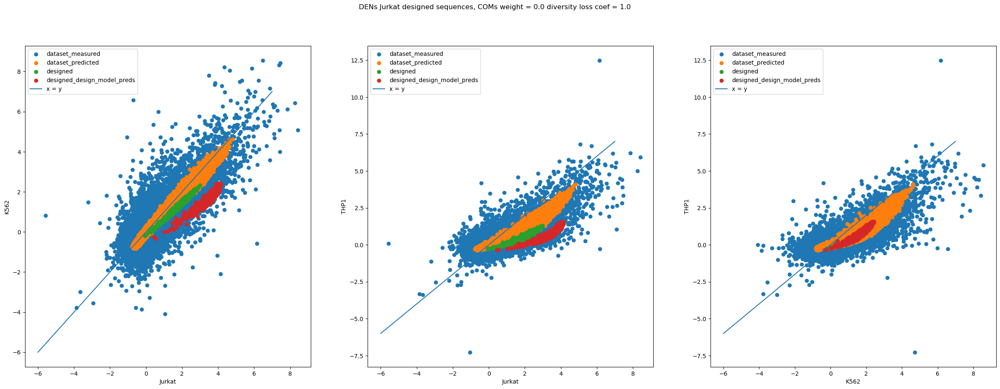

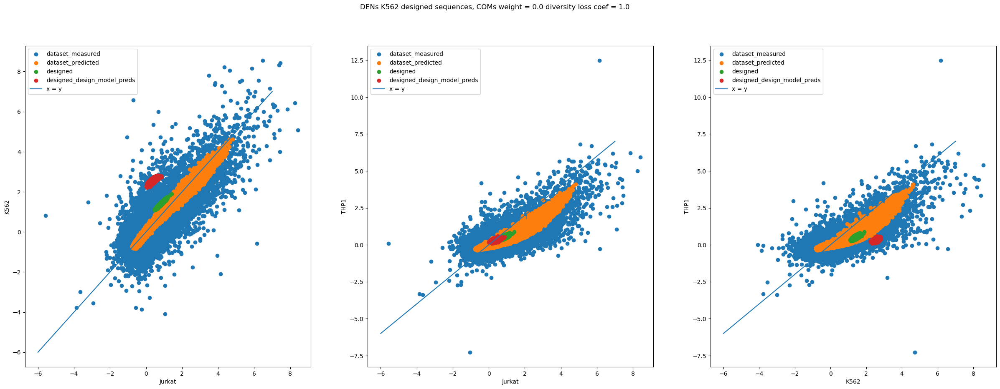

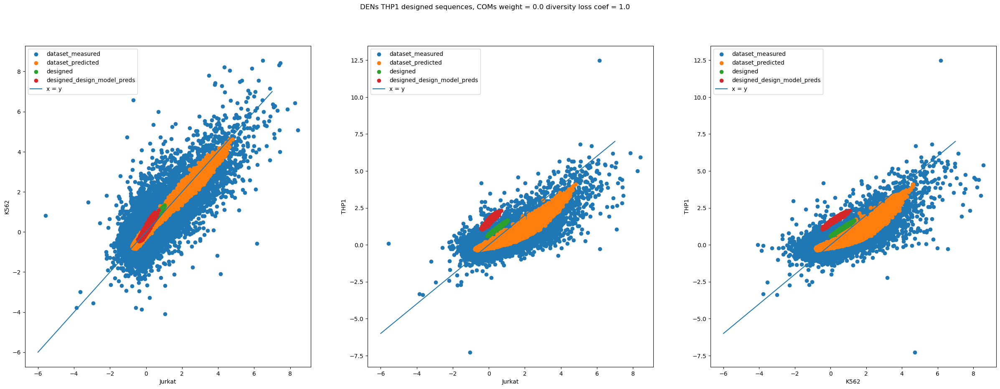

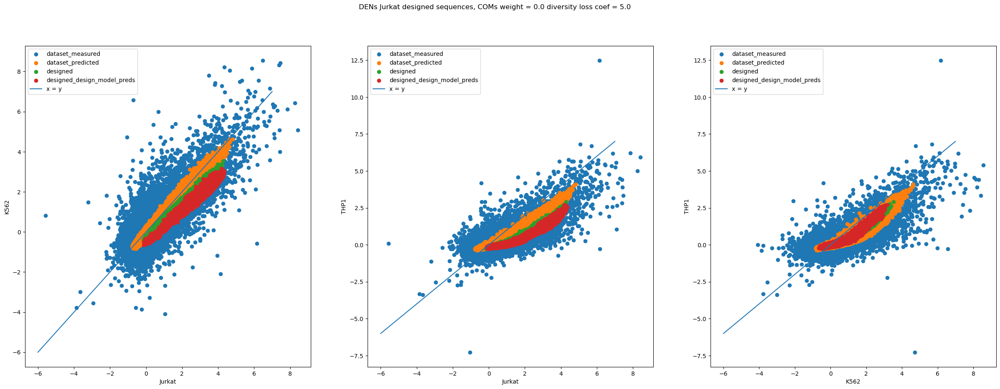

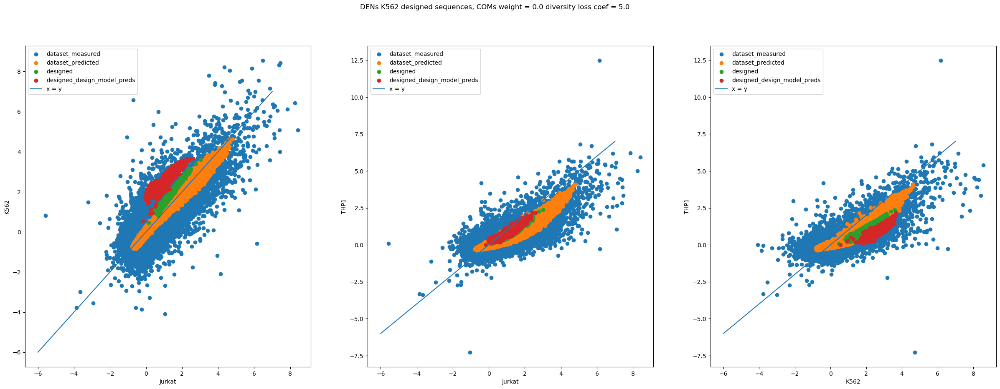

...

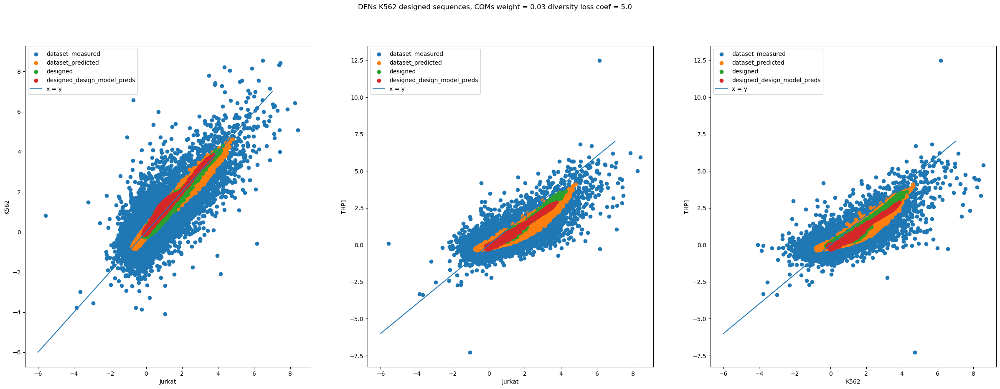

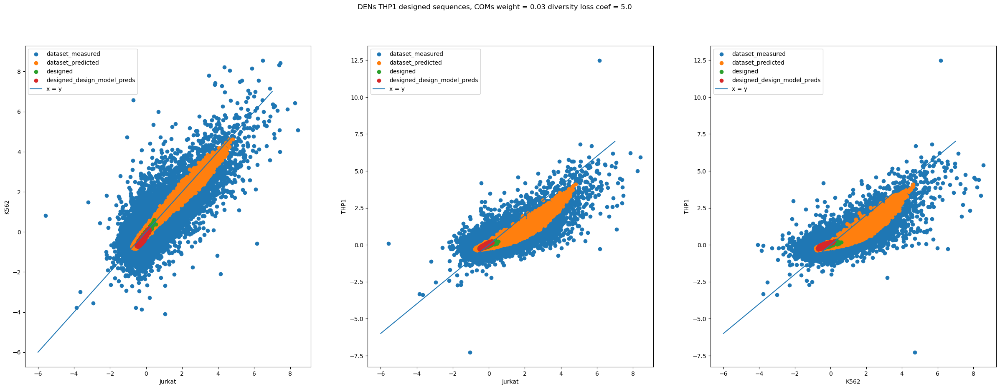

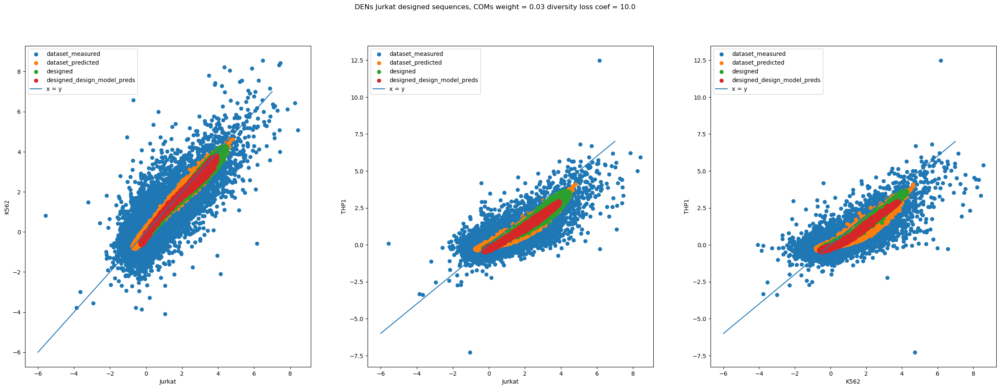

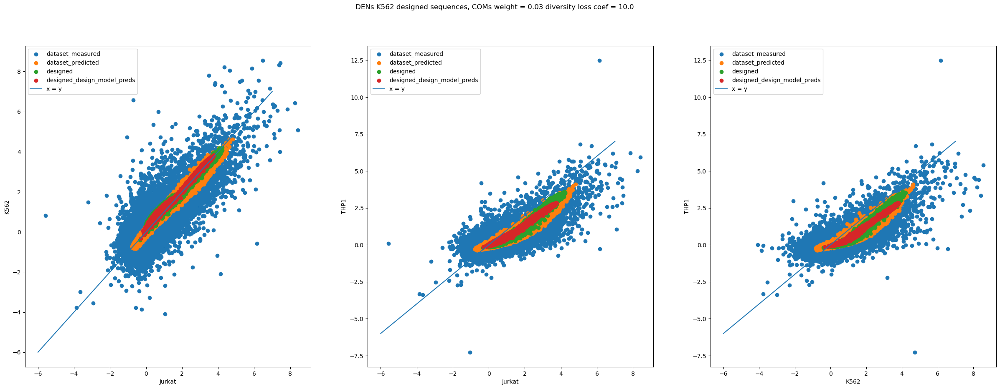

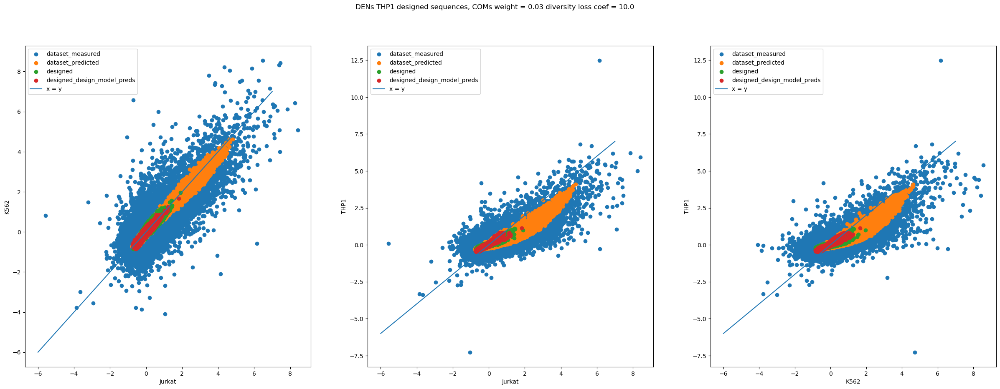

In [5]:
dataset_df = final_sequences[final_sequences["design_method"] == "Dataset"]
for design_method in ["DENs"]:
    print(design_method)
    
    this_method_df = final_sequences[final_sequences["design_method"] == "DENs"]
    if design_method == "COMs":
        for group, group_df in this_method_df.groupby(["coms_alpha", "designed_for"]):
            coms_alpha, design_cell = group
            fig, ax = plt.subplots(1, 3, figsize=(30, 10))
            c = 0
            for i, cell in enumerate(["Jurkat", "K562", "THP1"]):
                for j, cell2 in enumerate(["Jurkat", "K562", "THP1"]):
                    if i >= j:
                        continue
                        
                    ax[c].scatter(x=dataset_df[cell + "_measured"], y=dataset_df[cell2 + "_measured"], label="dataset_measured")
                    ax[c].scatter(x=dataset_df[cell], y=dataset_df[cell2], label="dataset_predicted")
                    ax[c].scatter(x=group_df[cell], y=group_df[cell2], label="designed")
                    ax[c].plot(np.arange(-6, 8), np.arange(-6, 8), label="x = y")
                    ax[c].set_xlabel(cell)
                    ax[c].set_ylabel(cell2)
                    ax[c].legend()
                    c += 1
                fig.suptitle(f"COMs {design_cell} designed sequences, weight = {coms_alpha}")
            plt.show()
    elif design_method == "DENs":
        for group, group_df in this_method_df.groupby(["coms_alpha", "diversity_loss_coef", "entropy_loss_coef", "designed_for"]):            
            coms_alpha, diversity_loss_coef, entropy_loss_coef, design_cell = group
            fig, ax = plt.subplots(1, 3, figsize=(30, 10))
            c = 0
            for i, cell in enumerate(["Jurkat", "K562", "THP1"]):
                for j, cell2 in enumerate(["Jurkat", "K562", "THP1"]):
                    if i >= j:
                        continue
                        
                    ax[c].scatter(x=dataset_df[cell + "_measured"], y=dataset_df[cell2 + "_measured"], label="dataset_measured")
                    ax[c].scatter(x=dataset_df[cell], y=dataset_df[cell2], label="dataset_predicted")
                    ax[c].scatter(x=group_df[cell], y=group_df[cell2], label="designed")
                    ax[c].scatter(x=group_df[cell + "_design_model"], y=group_df[cell2 + "_design_model"], label="designed_design_model_preds")
                    ax[c].plot(np.arange(-6, 8), np.arange(-6, 8), label="x = y")
                    ax[c].set_xlabel(cell)
                    ax[c].set_ylabel(cell2)
                    ax[c].legend()
                    c += 1
                fig.suptitle(f"DENs {design_cell} designed sequences, COMs weight = {coms_alpha} diversity loss coef = {diversity_loss_coef}")
            plt.show()

In [24]:
# filtering
min_expression_per_cell = {"Jurkat": 2.0, "K562": 2.0, "THP1": 2.0}
min_diff_expression_per_cell = {"Jurkat": 1.0, "K562": 1.0, "THP1": 0.25}

final_designed_sequences = final_sequences[final_sequences["design_method"] != "Dataset"]
final_designed_sequences["min_exp_filter_out"] = False

# remove sequences with expression less than min_expression
for cell in ["Jurkat", "K562", "THP1"]:
    min_expression = min_expression_per_cell[cell]
    final_designed_sequences.loc[np.logical_and(final_designed_sequences["designed_for"] == cell,
                                            final_designed_sequences[cell] < min_expression), 
                                 "min_exp_filter_out"] = True
    kept = final_designed_sequences[np.logical_and(final_designed_sequences["designed_for"] == cell,
                                            final_designed_sequences[cell] >= min_expression)]
    print(f"{cell} num sequences with expression greater than threshold {min_expression} = {kept.shape[0]}")

final_designed_sequences = final_designed_sequences[~final_designed_sequences["min_exp_filter_out"]]
print("Removed sequences with low expression")

final_designed_sequences["design_cell_diff_exp"] = 0.0
final_designed_sequences["min_diff_exp_filter_out"] = False
# compute differential expression
for cell in ["Jurkat", "K562", "THP1"]:
    min_diff_expression = min_diff_expression_per_cell[cell]
    
    other_cells = []
    for cell2 in ["Jurkat", "K562", "THP1"]:
        if cell2 != cell:
            other_cells.append(cell2)
    
    this_cell_exp = final_designed_sequences.loc[final_designed_sequences["designed_for"] == cell, cell]
    other_cell_exps = np.stack([final_designed_sequences.loc[final_designed_sequences["designed_for"] == cell, cell2] 
                       for cell2 in other_cells])
    
    final_designed_sequences.loc[final_designed_sequences["designed_for"] == cell, "design_cell_diff_exp"] = this_cell_exp - np.mean(other_cell_exps, axis=0)
    
    final_designed_sequences.loc[np.logical_and(final_designed_sequences["designed_for"] == cell,
                                            final_designed_sequences["design_cell_diff_exp"] < min_diff_expression), 
                                 "min_diff_exp_filter_out"] = True
    kept = final_designed_sequences[np.logical_and(final_designed_sequences["designed_for"] == cell,
                                            final_designed_sequences["design_cell_diff_exp"] >= min_diff_expression)]
    print(f"{cell} num sequences with differential expression greater than threshold {min_diff_expression} = {kept.shape[0]}")
    
final_designed_sequences = final_designed_sequences[~final_designed_sequences["min_diff_exp_filter_out"]]
print("Removed sequences with low differential expression")

/global/scratch/users/aniketh/tmp/ipykernel_42715/786346635.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_designed_sequences["min_exp_filter_out"] = False


Jurkat num sequences with expression greater than threshold 2.0 = 340462
K562 num sequences with expression greater than threshold 2.0 = 133846
THP1 num sequences with expression greater than threshold 2.0 = 48295
Removed sequences with low expression
Jurkat num sequences with differential expression greater than threshold 1.0 = 188237
K562 num sequences with differential expression greater than threshold 1.0 = 48579
THP1 num sequences with differential expression greater than threshold 0.25 = 17470
Removed sequences with low differential expression


In [13]:
final_designed_sequences.reset_index(drop=True).to_parquet(os.path.join(sequence_analysis_dir, "filtered_sequences.parquet"))
final_designed_sequences.reset_index(drop=True)

,design_method,designed_for,original_sequence,sequence,coms_alpha,diversity_loss_coef,entropy_loss_coef,Jurkat,Jurkat_measured,Jurkat_std,...,K562_measured,K562_std,K562_design_model,THP1,THP1_measured,THP1_std,THP1_design_model,min_exp_filter_out,design_cell_diff_exp,min_diff_exp_filter_out
0,COMs,Jurkat,CGGCGCTGTCCGCCCTGCGCGCGGCCGCCTCGGGCCCGAGGGAGGC...,CGACCGTATAAGACCAGCGCGTCGCTGTCTAGGGGTGTAGGTATGT...,0.0,NaN,NaN,2.784221,NaN,0.368632,...,NaN,0.250622,2.144753,1.000783,NaN,0.294756,1.192415,False,1.228874,False
1,COMs,Jurkat,ACGTGAAAACAAGGAGTGATCTCTATGCTCTGCCCAGGGTGGGGGC...,GCAATGTTTACACGTACCATTGCGATATGATTAACAGGGTGGCGGC...,0.0,NaN,NaN,2.244540,NaN,0.321221,...,NaN,0.274446,1.943239,0.527341,NaN,0.231550,0.886136,False,1.090496,False
2,COMs,Jurkat,CACCAGGGCAAACAGGTGAGCGCCTCGGCCAATCCTTCCCCGGAAA...,TAGGGTGGCGATCAGGTAGGTTGGTTGTCCCATCACCGGCGGCGGG...,0.0,NaN,NaN,2.193900,NaN,0.580226,...,NaN,0.214969,1.417316,0.645734,NaN,0.236595,0.731049,False,1.080767,False
3,COMs,Jurkat,CGCATGCGCCCTGGCCTTCCCCGCCCGAGTGAGCGGAAGTCTCGTG...,CGCATGCGTACCGGGCATCTCGGATCGCGTGAGGTTACGTACCGTG...,0.0,NaN,NaN,2.944587,NaN,0.324115,...,NaN,0.198942,1.771886,1.045334,NaN,0.221198,0.903099,False,1.325049,False
4,COMs,Jurkat,GGGCGGCCCGCGAGGCGGCAGGGCGGACGGGCAAGCGGCCAACTCT...,GGGCGATGCGCGATGTTATATGTCGTTAGCGTACGCGTCGGATTAG...,0.0,NaN,NaN,2.095697,NaN,0.343311,...,NaN,0.189040,1.593851,0.479965,NaN,0.233562,0.761457,False,1.024855,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
254281,DENs,K562,None,TTATCTCAAAATCAAAACAAAAAACTAACCAATAACAACCGAAGCG...,0.0,10.0,10.0,1.947514,NaN,0.301117,...,NaN,0.414478,3.046804,1.342691,NaN,0.244217,1.400236,False,1.023452,False
254282,DENs,K562,None,CCCCCCCCCCCCCAACAAAGGAACCAACAGATCCCCTAATCTAGCC...,0.0,10.0,10.0,2.339691,NaN,0.284028,...,NaN,0.429260,3.376089,1.583109,NaN,0.262861,1.727570,False,1.017039,False
254283,DENs,K562,None,TATTTAAACCAAAACTAAAAAAACAAACAAAAAAACAAACCCAAAC...,0.0,10.0,10.0,2.091747,NaN,0.330629,...,NaN,0.558544,3.309952,1.417627,NaN,0.310929,1.399321,False,1.003026,False
254284,DENs,K562,None,TATAACCATTTATCCCCAACCCCCAACCAAAACTAAACCAAACAAA...,0.0,10.0,10.0,2.135503,NaN,0.304286,...,NaN,0.489996,3.226063,1.602020,NaN,0.304027,1.593905,False,1.014450,False


<Axes: xlabel='design_method', ylabel='count'>

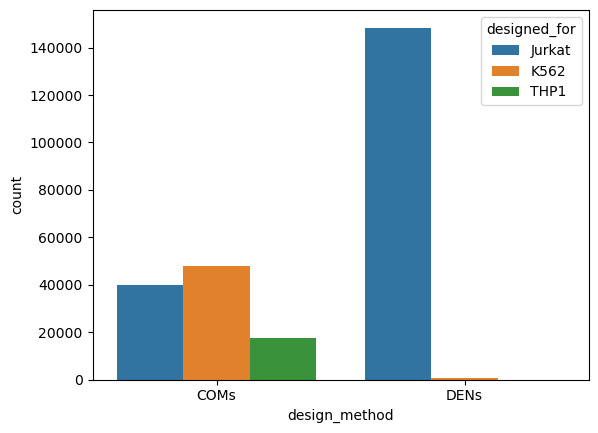

In [25]:
sns.countplot(data=final_designed_sequences.reset_index(drop=True), x="design_method", hue="designed_for")

In [26]:
final_designed_sequences[final_designed_sequences["designed_for"] == "Jurkat"].reset_index(drop=True)

,design_method,designed_for,original_sequence,sequence,coms_alpha,diversity_loss_coef,entropy_loss_coef,Jurkat,Jurkat_measured,Jurkat_std,...,K562_measured,K562_std,K562_design_model,THP1,THP1_measured,THP1_std,THP1_design_model,min_exp_filter_out,design_cell_diff_exp,min_diff_exp_filter_out
0,COMs,Jurkat,CGGCGCTGTCCGCCCTGCGCGCGGCCGCCTCGGGCCCGAGGGAGGC...,CGACCGTATAAGACCAGCGCGTCGCTGTCTAGGGGTGTAGGTATGT...,0.0,NaN,NaN,2.784221,NaN,0.368632,...,NaN,0.250622,2.144753,1.000783,NaN,0.294756,1.192415,False,1.228874,False
1,COMs,Jurkat,ACGTGAAAACAAGGAGTGATCTCTATGCTCTGCCCAGGGTGGGGGC...,GCAATGTTTACACGTACCATTGCGATATGATTAACAGGGTGGCGGC...,0.0,NaN,NaN,2.244540,NaN,0.321221,...,NaN,0.274446,1.943239,0.527341,NaN,0.231550,0.886136,False,1.090496,False
2,COMs,Jurkat,CACCAGGGCAAACAGGTGAGCGCCTCGGCCAATCCTTCCCCGGAAA...,TAGGGTGGCGATCAGGTAGGTTGGTTGTCCCATCACCGGCGGCGGG...,0.0,NaN,NaN,2.193900,NaN,0.580226,...,NaN,0.214969,1.417316,0.645734,NaN,0.236595,0.731049,False,1.080767,False
3,COMs,Jurkat,CGCATGCGCCCTGGCCTTCCCCGCCCGAGTGAGCGGAAGTCTCGTG...,CGCATGCGTACCGGGCATCTCGGATCGCGTGAGGTTACGTACCGTG...,0.0,NaN,NaN,2.944587,NaN,0.324115,...,NaN,0.198942,1.771886,1.045334,NaN,0.221198,0.903099,False,1.325049,False
4,COMs,Jurkat,GGGCGGCCCGCGAGGCGGCAGGGCGGACGGGCAAGCGGCCAACTCT...,GGGCGATGCGCGATGTTATATGTCGTTAGCGTACGCGTCGGATTAG...,0.0,NaN,NaN,2.095697,NaN,0.343311,...,NaN,0.189040,1.593851,0.479965,NaN,0.233562,0.761457,False,1.024855,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188232,DENs,Jurkat,None,TTATTTATCATTTACCTAATATATTATTCAATCCACCCCGGATATA...,0.0,10.0,10.0,2.647459,NaN,0.291697,...,NaN,0.218749,2.041579,1.054448,NaN,0.220565,1.264455,False,1.043573,False
188233,DENs,Jurkat,None,CTCGCGAGTCGGTAGGGTAGGGGTGGGGGGTGGGGGGGGGGGGGCG...,0.0,10.0,10.0,3.343404,NaN,0.438374,...,NaN,0.476428,2.355870,1.882863,NaN,0.408499,1.786295,False,1.055874,False
188234,DENs,Jurkat,None,TCTTCCTCGAGAGTCGGTATTCGCGTGGGTATTGAGAGTGGTAGAG...,0.0,10.0,10.0,2.537449,NaN,0.213231,...,NaN,0.182301,1.914025,1.099943,NaN,0.183937,1.177100,False,1.027186,False
188235,DENs,Jurkat,None,TCTATATCATTTACATTCCCCATCCCCTTATCCGTAGTTAGATATC...,0.0,10.0,10.0,3.781680,NaN,0.395418,...,NaN,0.398631,3.026019,2.286160,NaN,0.309376,2.452130,False,1.015525,False
